In [1]:
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Sharpening

For sharpening what we do is simple.

Smoothing is kind of a low pass filtered signal. In circuits what we do is extracting low pass filtered signal from a certain componant. At the same time the high pass filtered version of the signal was atthe rest of the cuircuit.

This is analogous to what we do in image processing. When we get the low pass filtered image, the rest of the image is the high pass filtered part is in the rest of the image.

So what we do is substracting the amoothened image from original.

kernel
[[0.15246914]
 [0.2218413 ]
 [0.25137912]
 [0.2218413 ]
 [0.15246914]]

img
uint8
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]

blurred
uint8
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 254 ... 255 255 255]
 ...
 [255 255 254 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]

diff
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

sharpened
float32
[[255.  255.  255.  ... 255.  255.  255. ]
 [255.  255.  255.  ... 255.  255.  255. ]
 [255.  255.  256.5 ... 255.  255.  255. ]
 ...
 [255.  255.  256.5 ... 255.  255.  255. ]
 [255.  255.  255.  ... 255.  255.  255. ]
 [255.  255.  255.  ... 255.  255.  255. ]]



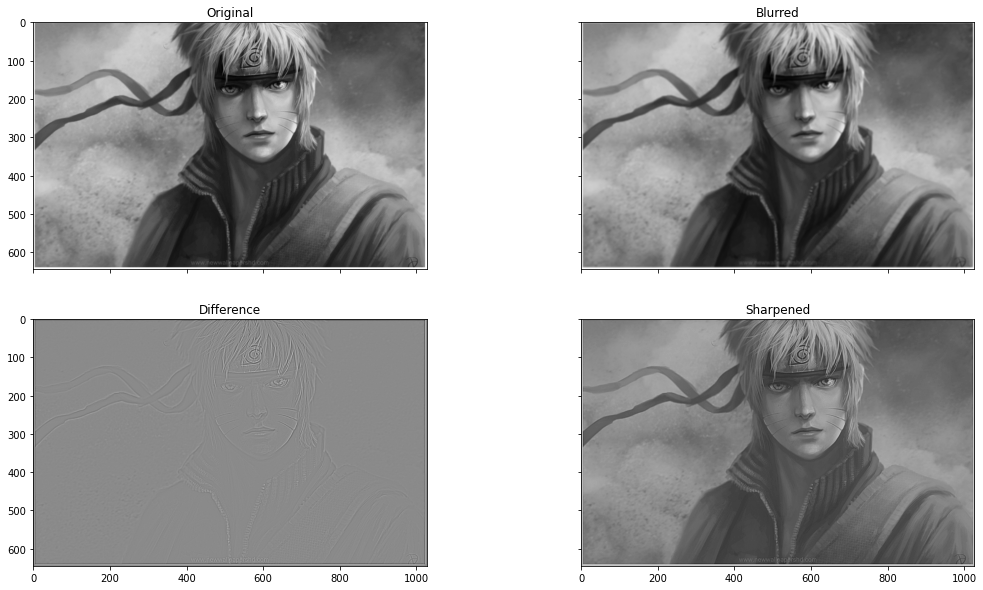

In [2]:
fig, axes  = plt.subplots(2,2, sharex='all', sharey='all', figsize=(18,10)) # creating a figure to show results
img = cv.imread('./images/naruto.jpg', cv.IMREAD_REDUCED_GRAYSCALE_2)
axes[0,0].imshow(img, cmap="gray")
axes[0,0].set_title('Original')

sigma = 2
kernel = cv.getGaussianKernel(5, sigma)
print("kernel")
print(kernel)
print("")

blurred = cv.sepFilter2D(img, -1, kernel, kernel, anchor=(-1,-1), delta=0, borderType=cv.BORDER_REPLICATE)
print("img")
print(img.dtype)
print(img)
print("")
print("blurred")
print(blurred.dtype)
print(blurred)
print("")
axes[0,1].imshow(blurred, cmap="gray")
axes[0,1].set_title('Blurred')

diff = img.astype('float32') - blurred.astype('float32') # converting to float32 is essential. otherwise output array will be                                                                    saturated in both ends and won't be suitable to use for addweighted                                                                   function.
#diff = img.astype('uint8') - blurred.astype('uint8')
axes[1,0].imshow(diff, cmap="gray")
axes[1,0].set_title('Difference')
print("diff")
print(diff)
print("")

sharpened = cv.addWeighted(img.astype('float32') , 1.0, diff, 1.5, 0)
print("sharpened")
print(sharpened.dtype)
print(sharpened)
print("")

axes[1,1].imshow(sharpened, cmap="gray")
axes[1,1].set_title('Sharpened')

plt.show()

There is a small difference in the filter function and the kernel we used here.

We have used sepfilter2D instead of filter2D and alos the kernel is 1D kernel instead of 2D kernel we used earlier in filter2D.

Let's take a look at the sepFilter2D function

# sepFilter2D

dst	=	cv.sepFilter2D(	src, ddepth, kernelX, kernelY[, dst[, anchor[, delta[, borderType]]]]	)

Parameters

        src	        Source image.
        dst	        Destination image of the same size and the same number of channels as src .
        ddepth	        Destination image depth, see combinations
        kernelX	        Coefficients for filtering each row.
        kernelY	        Coefficients for filtering each column.
        anchor	        Anchor position within the kernel. The default value (−1,−1) means that the anchor is at the kernel center.
        delta	        Value added to the filtered results before storing them.
        borderType      Pixel extrapolation method, see BorderTypes. BORDER_WRAP is not supported.

Applies a separable linear filter to an image.

The function applies a separable linear filter to the image. That is, first, every row of src is filtered with the 1D kernel kernelX. Then, every column of the result is filtered with the 1D kernel kernelY. The final result shifted by delta is stored in dst .

[More Information](https://docs.opencv.org/master/d4/d86/group__imgproc__filter.html#ga910e29ff7d7b105057d1625a4bf6318d)

SepFilter2D function is more efficient than Filter2D

Let's take a look at addweighted function

# addweighted

dst	=	cv.addWeighted(	src1, alpha, src2, beta, gamma[, dst[, dtype]]	)

Parameters

    src1	first input array.
    alpha	weight of the first array elements.
    src2	second input array of the same size and channel number as src1.
    beta	weight of the second array elements.
    gamma	scalar added to each sum.
    dst	    output array that has the same size and number of channels as the input arrays.
    dtype	optional depth of the output array; when both input arrays have the same depth, dtype can be set to -1, which will be equivalent to src1.depth().

The function addWeighted calculates the weighted sum of two arrays as follows:

dst = src1 x alpha + src2 x beta + gamma;

Instead of going through all of those process we can build a single kernel to do the job

# Unsharp Mask Filter

let's look at how this method work

![](note.jpg)

Above method is implemented in the below code

In [3]:
sigma = 1

X = np.arange(-5, 5.25, 0.25)
Y = np.arange(-5, 5.25, 0.25)
X, Y = np.meshgrid(X, Y) # creating the X and Y arrays which are used to store the x and y coordinate of the each pixel

Z = np.exp(-(X**2 + Y**2)/(2*sigma**2)) # creating the gaussian kernel
imp = np.zeros(Z.shape)                 # creating the zero array to implement the delta function
print(Z.shape)
imp[int(Z.shape[0]/2), int(Z.shape[1]/2)] = 2 # setting the centre of the 2D array to 1+alfa to create the delta function( here alfa=1)
Z = imp - Z # sharpening keernel

(41, 41)


(-5.5, 5.5, -5.5, 5.5)

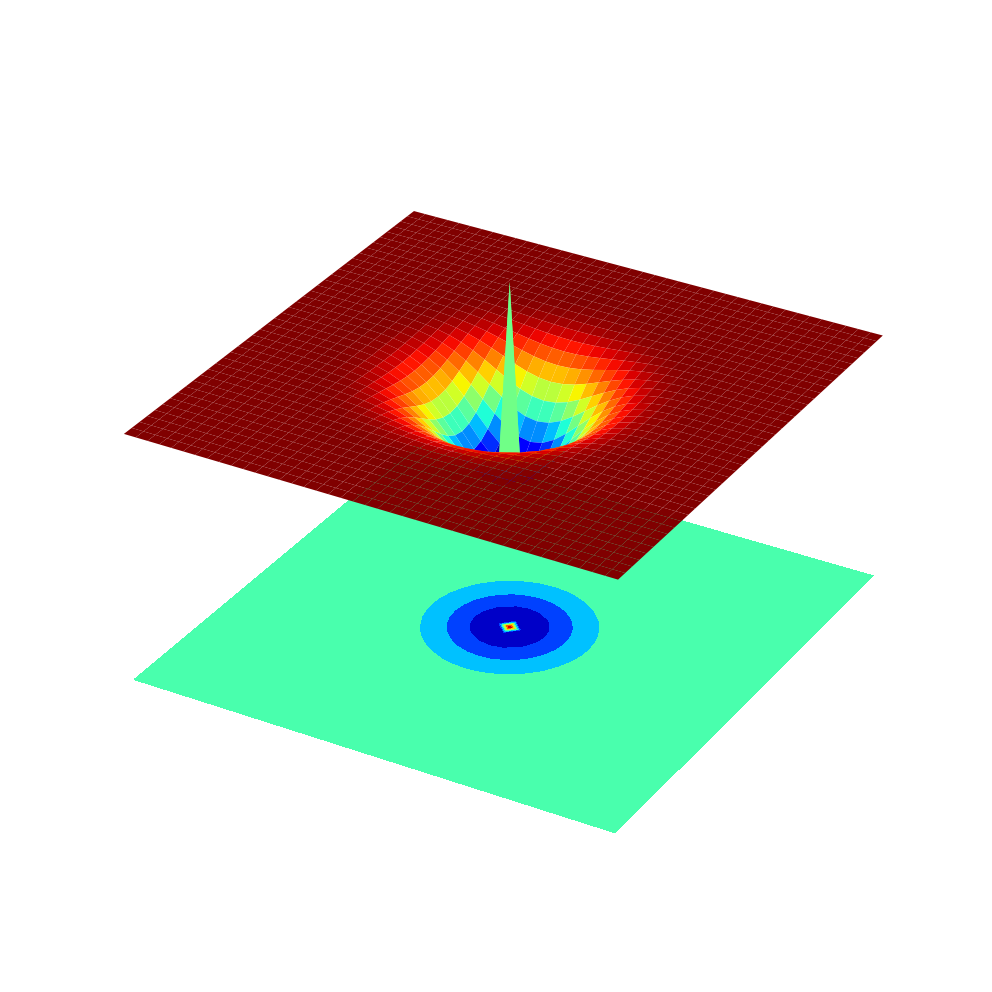

In [4]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure(figsize=(18,18))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(X, Y, Z, cmap=cm.jet, linewidth=0, antialiased=True)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
ax.set_aspect('auto', 'box')
cset = ax.contourf(X, Y, Z, zdir='z', offset=np.min(Z) -1.5, cmap=cm.jet)
ax.set_zlim(np.min(Z) - 2, np.max(Z))
plt.axis('off')

Let's not look at 3d plotting for now.

Let's apply this to an image

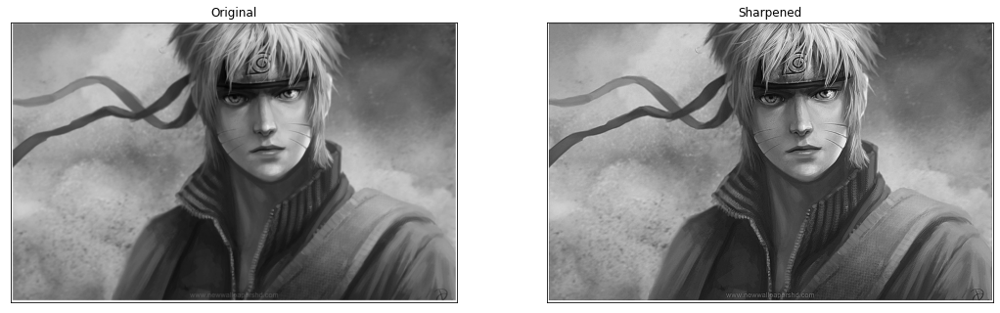

In [5]:
img = cv.imread('./images/naruto.jpg', cv.IMREAD_REDUCED_GRAYSCALE_2)

kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype='float') # kernel is calculated by hand
imgc = cv.filter2D(img,-1,kernel)

fig, axes  = plt.subplots(1,2, sharex='all', sharey='all', figsize=(18,18))
axes[0].imshow(img, cmap='gray')
axes[0].set_title('Original')
axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(imgc, cmap='gray')
axes[1].set_title('Sharpened')
axes[1].set_xticks([]), axes[1].set_yticks([])
plt.show()

# Smoothing

We are mainly focusing on box filter and gausian filters and their behaviour

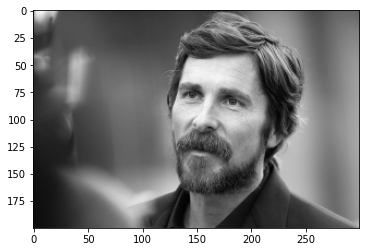

In [6]:
img = cv.imread('./images/bale.jpg', cv.IMREAD_REDUCED_GRAYSCALE_4) #Reading an image to an array
plt.imshow(img, cmap='gray') # creating a new figure and creating the image in it
plt.show() # showing all the created figures

Let's create a box filter kernel and apply the transformation using Filter2D

We talked about the Filter2D function in the previous tutorial.

## box filter

[[0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568]]


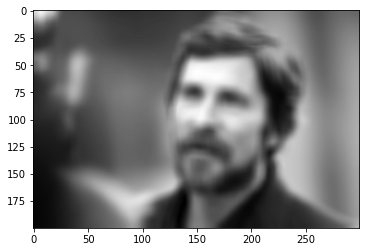

In [7]:
box = 1./81.*np.ones((9,9))
print(box)
imgb = cv.filter2D(img,-1,box)
plt.imshow(imgb, cmap='gray') # creating a new figure and creating the image in it
plt.show() 

If you observed the above part keenly you will observe that the box filter kernel is similar to an average filter. But you can see the square shapes imposed in the the image. It's because we use vector dot product here and what dot product does is imposing the similarities.

## gausian filter

[[0.08167442]
 [0.10164546]
 [0.11883558]
 [0.13051536]
 [0.13465836]
 [0.13051536]
 [0.11883558]
 [0.10164546]
 [0.08167442]]


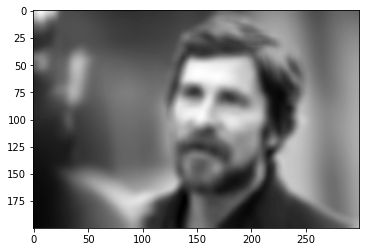

In [8]:
gaus = cv.getGaussianKernel(9, 4) #create a 1D vector
print(gaus)
imgg = cv.sepFilter2D(img, -1, gaus, gaus)
plt.imshow(imgg, cmap='gray') # creating a new figure and creating the image in it
plt.show()

# Creatign a Gaussian Kernel

In [9]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

#here are some important libraries

In [10]:
sigma = 0.5

In [11]:
X = np.arange(-5, 5, 0.01)
Y = np.arange(-5, 5, 0.01)
print(X)
print(Y)
X, Y = np.meshgrid(X, Y)
print(X)
print(Y)
Z = 1/(2*np.pi*sigma**2)*np.exp(-(X**2 + Y**2)/(2*sigma**2))
print(Z) 

0e+00  2.6300000e+00
  2.6400000e+00  2.6500000e+00  2.6600000e+00  2.6700000e+00
  2.6800000e+00  2.6900000e+00  2.7000000e+00  2.7100000e+00
  2.7200000e+00  2.7300000e+00  2.7400000e+00  2.7500000e+00
  2.7600000e+00  2.7700000e+00  2.7800000e+00  2.7900000e+00
  2.8000000e+00  2.8100000e+00  2.8200000e+00  2.8300000e+00
  2.8400000e+00  2.8500000e+00  2.8600000e+00  2.8700000e+00
  2.8800000e+00  2.8900000e+00  2.9000000e+00  2.9100000e+00
  2.9200000e+00  2.9300000e+00  2.9400000e+00  2.9500000e+00
  2.9600000e+00  2.9700000e+00  2.9800000e+00  2.9900000e+00
  3.0000000e+00  3.0100000e+00  3.0200000e+00  3.0300000e+00
  3.0400000e+00  3.0500000e+00  3.0600000e+00  3.0700000e+00
  3.0800000e+00  3.0900000e+00  3.1000000e+00  3.1100000e+00
  3.1200000e+00  3.1300000e+00  3.1400000e+00  3.1500000e+00
  3.1600000e+00  3.1700000e+00  3.1800000e+00  3.1900000e+00
  3.2000000e+00  3.2100000e+00  3.2200000e+00  3.2300000e+00
  3.2400000e+00  3.2500000e+00  3.2600000e+00  3.2700000e+00
  3

Let's try to understand what happened.

To calculate z we must know X and Y coordinate of every pixel of the kernel. That is the reason in creating the X and Y meshes. X(i,j)gives the x coordinate of the (i,j)th pixel.

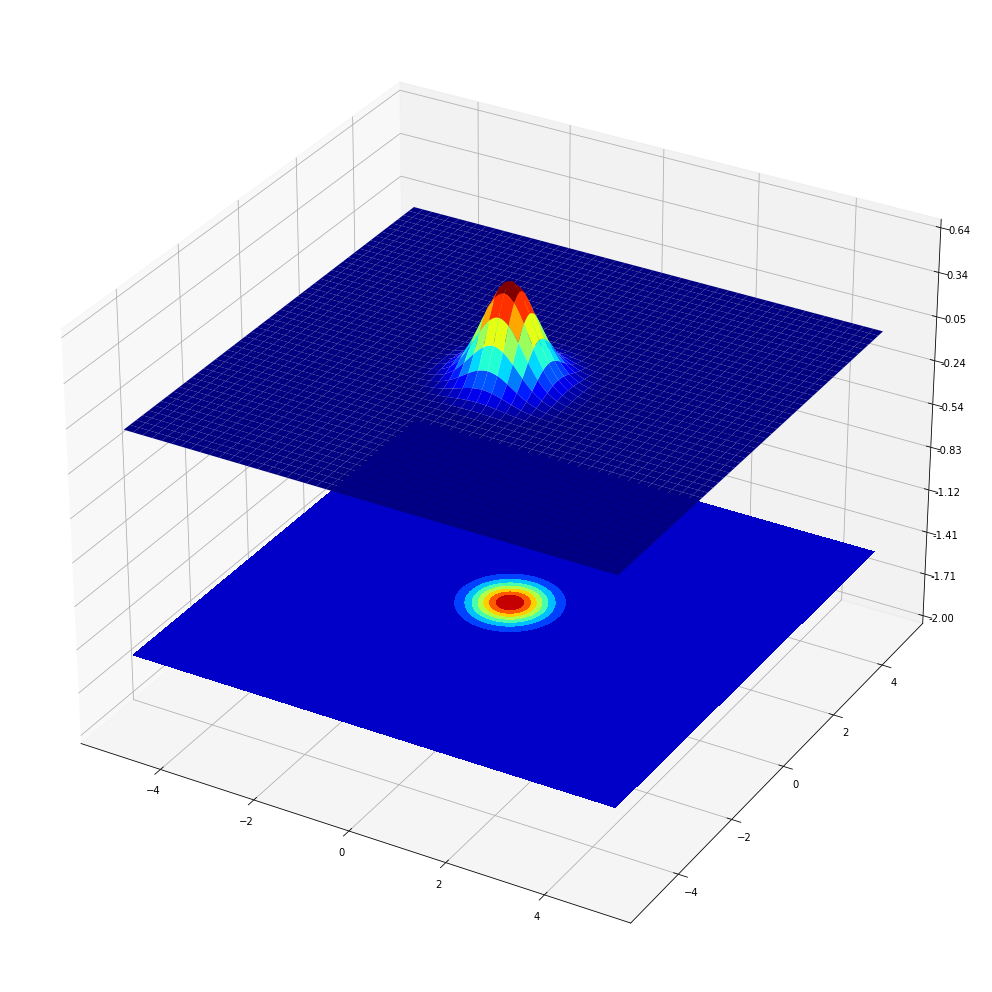

In [12]:
fig = plt.figure(figsize=(18,18))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap=cm.jet, linewidth=0, antialiased=True)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
ax.set_aspect('auto', 'box')
cset = ax.contourf(X, Y, Z, zdir='z', offset=np.min(Z) -1.5, cmap=cm.jet)
ax.set_zlim(np.min(Z) - 2, np.max(Z))
#plt.axis('off')
plt.show()

Let's make this more complicated and skip the plotting details for now. Because plotting the kernel is not our main purpose.

Let's try to filter noise with a gausian filter

# Gaussian Noise Filtering

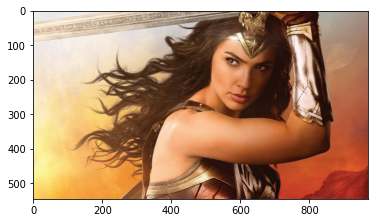

In [13]:
img = cv.imread('./images/gal.jpg', cv.IMREAD_COLOR)
imgt=cv.cvtColor(img,cv.COLOR_RGB2BGR)
plt.imshow(imgt)

To remove the noise first let's add some random noise

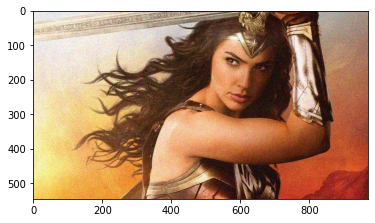

In [14]:
mu = 0.0
sigma = 20
h, w, c = img.shape
noise = np.random.normal(mu,sigma, (h, w, c)) #creating an image array of the same shape of the original image
#print(noise)
nimg=cv.add(img, noise,dtype = cv.CV_8UC3) #adding the noise to three all channels of the original image. (8UC3 stands for unsigned 8 bits 3 channels)
imgt=cv.cvtColor(nimg,cv.COLOR_RGB2BGR)
plt.imshow(imgt)

Let's create the gauian kernel and filter the image

In [15]:
sigma=3
kernel=cv.getGaussianKernel(11,sigma) #creating 1D gausian vector
filtered=cv.sepFilter2D(nimg,-1,kernel,kernel) #filtering the image with the kernel

cv.imshow("original",img)
cv.waitKey(0)
cv.imshow("noisy",nimg)
cv.waitKey(0)
cv.imshow("filtered", filtered)
cv.waitKey(0)
cv.destroyAllWindows()

If try to change and play with the sigma value you will see that the bluriness of the filtered image changing. When sigma is increased the bluriness also increases. Let' observe how sigma value afftect on the kernal.

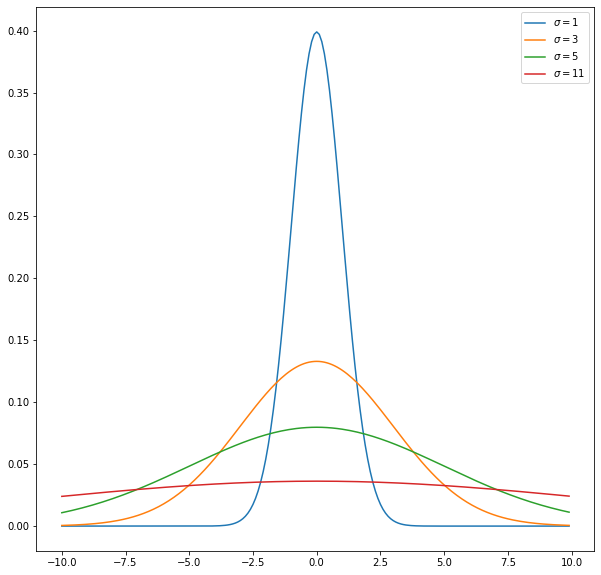

In [16]:
def g(x, mu, sigma): # this function creates an gausian kernel of shape len(x)*len(x)
    return 1./(sigma*np.sqrt(2.*np.pi))*np.exp(-(x-mu)**2/(2*sigma**2))


x = np.arange(-10., 10., 0.1) #creating an array to use as x axis and also a the y axis at the same time
fig, ax  = plt.subplots(1,1, sharex='all', sharey='all', figsize=(10,10))
ax.plot(x, g(x, 0, 1), label='$\sigma=1$')
ax.plot(x, g(x, 0, 3), label='$\sigma=3$')
ax.plot(x, g(x, 0, 5), label='$\sigma=5$')
ax.plot(x, g(x, 0,11), label='$\sigma=11$')
ax.legend()
plt.show()

You can see that if we use sigma=11 the function is almot flat and similar to average filter function. So for higher sigma values we have to use larger kernels.

## rule of thumb : halfwidth of the kernel = 3*sigma

So the kernel size will be : (2*3*sigma+1)x(2*3*sigma+1)

# Noise

Let's try to add different kibds of noise to an image.

In [17]:
def noisy(noise_typ,image):    
    """
    Parameters
    ----------
    image : ndarray
        Input image data. Will be converted to float.
    mode : str
        One of the following strings, selecting the type of noise to add:

        'gauss'     Gaussian-distributed additive noise.
        'poisson'   Poisson-distributed noise generated from the data.
        's&p'       Replaces random pixels with 0 or 1.
        'speckle'   Multiplicative noise using out = image + n*image,where
                    n is uniform noise with specified mean & variance.
        
        Source: https://stackoverflow.com/a/30609854
    """    
    if noise_typ == "gauss":
        row,col,ch= image.shape
        mean = 0
        var = 100.
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        noisy = image + gauss
        noisy = np.clip(noisy, 0.0, 255.0)
        print(stats.describe(noisy.ravel()))
        return noisy
    elif noise_typ == "s&p":
        # row,col,ch = image.shape
        s_vs_p = 0.5
        amount = 0.2
        out = np.copy(image)
        # Salt mode
        num_salt = np.ceil(amount * image.size * s_vs_p)
        coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
        out[coords] = 255

        # Pepper mode
        num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
        coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
        out[coords] = 0
        return out
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
    elif noise_typ =="speckle":
        row,col,ch = image.shape
        gauss = np.random.randn(row,col,ch)
        gauss = gauss.reshape(row,col,ch)        
        noisy = image + image * gauss
        noisy = np.clip(noisy, 0.0, 255.0)
        return noisy

Above function will output an image array with noise we provide. No need in looking intto the function. It will make things way too complicated. Intenion is to visualize the noise types.

In [18]:
img = cv.imread('./images/naruto.jpg', cv.IMREAD_COLOR)

In [19]:
#cv.namedWindow("Image", cv.WINDOW_AUTOSIZE)
cv.imshow("Image", img)
cv.waitKey(0)

#Sault and Pepper
imn =  noisy('s&p', img.astype('float32'))
cv.imshow("Sault and Pepper", imn.astype('uint8'))
cv.waitKey(0)

#poisson
imn =  noisy('poisson', img.astype('float32'))
cv.imshow("poisson", imn.astype('uint8'))
cv.waitKey(0)

#speckle
imn =  noisy('speckle', img.astype('float32'))
cv.imshow("speckle", imn.astype('uint8'))
cv.waitKey(0)

cv.destroyAllWindows()

Let's look at how different level of noise and smoothing can be applied to an image

# Effect of Gaussian Noise Level and Smoothing Level

In [20]:
img = cv.imread('./images/bale.jpg', cv.IMREAD_REDUCED_GRAYSCALE_4)

mean = 0.
noise = [0.05, 0.1, 0.2] # list for creating noise arrays with different noise levels
sigma = [0, 1, 2]        # list for storing the sigma values for the gausian kernel that is used for blurring.
sigma_text = ['no smoothing', 'smoothing kernel 1 px', 'smoothing kernel 2 px']

-33.54819786522397 261.0981855656537
ksize 1
-26.75207707347021 255.58445108366547
ksize 3
-29.748046760244904 259.47081529359633
ksize 5
-81.91660843192405 313.39436626229275
ksize 1
-97.76480244909862 295.9264645474175
ksize 3
-76.70196777613734 296.3598443858947
ksize 5
-165.73608836821273 391.0087684455798
ksize 1
-183.22618269284516 398.0833273978704
ksize 3
-186.60146645186123 393.04197652347716
ksize 5


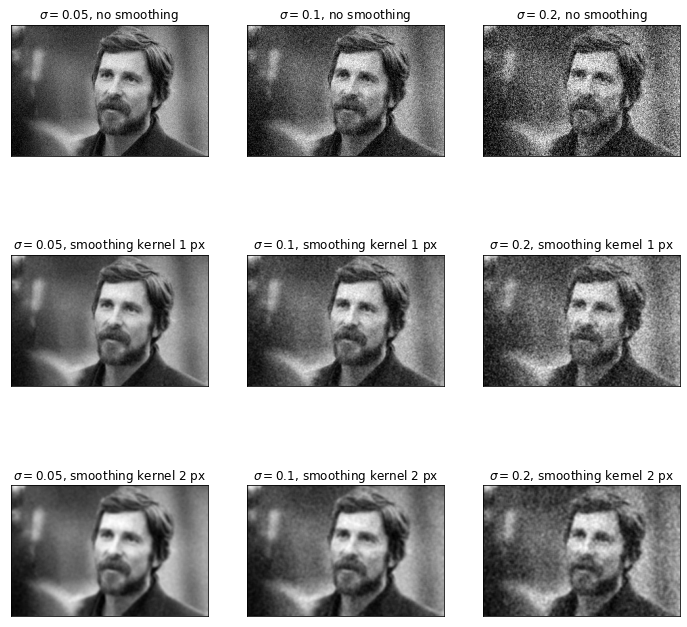

In [21]:
fig, axes  = plt.subplots(3, 3, sharex='all', sharey='all', figsize=(12,12)) # creating a figure to display output images at the same time.
for i in range(3): # loop to apply three levels of gausian smoothness
    for j in range(3): # loop to apply  3 levels of noise
        gauss = np.random.normal(mean,noise[i]*255., img.shape) # creating a noise array
        imn = img + gauss
                                              #adding the image array and the noise array
        print(np.min(imn),np.max(imn))        #checking the boundarie of the resultant array

        imn = np.clip(imn, 0.0, 255.0)
        ksize = sigma[j]*2+1                 #defining the kernel size according to the rule of thumb we discussed before
        print("ksize", ksize)                 
        if j != 0:
            imn = cv.GaussianBlur(imn, (ksize, ksize), sigmaX=sigma[j], sigmaY=sigma[j])
        
        axes[j,i].imshow(imn, cmap='gray')
        axes[j,i].set_title(r'$\sigma={0}$, {1}'.format(noise[i], sigma_text[j]))
        axes[j,i].set_xticks([]), axes[j,i].set_yticks([])
        
plt.show()

let's take a look at np.random.normal function for better understanding the code

## numpy.random.normal(loc=0.0, scale=1.0, size=None)

Draw random samples from a normal (Gaussian) distribution.

Parameters

        loc:    float or array_like of floats
                Mean (“centre”) of the distribution.

        scale   float or array_like of floats
                Standard deviation (spread or “width”) of the distribution. Must be non-negative.

        size    int or tuple of ints, optional
                Output shape. If the given shape is, e.g., (m, n, k), then m * n * k samples are drawn. If size is None (default), a                  single value is returned if loc and scale are both scalars. Otherwise, np.broadcast(loc, scale).size samples are                      drawn.

Returns

        out     ndarray or scalar
                Drawn samples from the parameterized normal distribution.

More details [here](https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html)

As you can see after adding the two float32 arrays the result will be probably exceeding the 0-255 limit.

So we need to scale the result down to uint8 range.

np.clip function is used for that purpose.

# numpy.clip
numpy.clip(a, a_min, a_max, out=None, **kwargs)[source]
Clip (limit) the values in an array.

Given an interval, values outside the interval are clipped to the interval edges. For example, if an interval of [0, 1] is specified, values smaller than 0 become 0, and values larger than 1 become 1.

## So as you can see this is not idealy scaling. It's clipping. But it gets the job done in a single line. 

## Defining the kernel size

We must do it according to the rule of thumb we discussed above. Otherwise filter won't be effective.

# But

In the code we have used ksize = sigma[j]*2+1 

If you try to use ksize = sigma[j]*3+1 you will see an error in the cv.GaussianBlur function.

To investigate about this problem let's take a look at the cv.GaussianBlur function

# [cv.GaussianBlur](https://docs.opencv.org/master/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1)

dst	=	cv.GaussianBlur(	src, ksize, sigmaX[, dst[, sigmaY[, borderType]]]	)

Parameters

        src	        input image; the image can have any number of channels, which are processed independently, but the depth                              should be CV_8U, CV_16U, CV_16S, CV_32F or CV_64F.

        dst	        output image of the same size and type as src.

        ksize	        Gaussian kernel size. ksize.width and ksize.height can differ but they both must be positive and odd. Or,                             they can be zero's and then they are computed from sigma.

        sigmaX	        Gaussian kernel standard deviation in X direction.

        sigmaY	        Gaussian kernel standard deviation in Y direction; if sigmaY is zero, it is set to be equal to sigmaX, if                             both sigmas are zeros, they are computed from ksize.width and ksize.height, respectively (see                                         getGaussianKernel for details); to fully control the result regardless of possible future modifications of                            all this semantics, it is recommended to specify all of ksize, sigmaX, and sigmaY.

        borderType	pixel extrapolation method, see BorderTypes. BORDER_WRAP is not supported.

# " height can differ but they both must be positive and odd. Or, they can be zero's and then they are computed from sigma "

As you can see ksize must be an odd number 

If we use sigmaj*3+1 it can give both odd and even values

So we can use either sigmaj*2+1 or sigmaj*4+1
both will always give odd output

## Any blur can't remove any kind of noise.

Let's try to remove sault and peper noise with gausian blur

[1. 2. 3.]


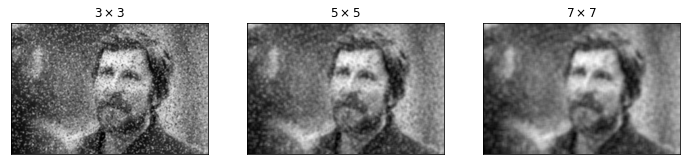

In [22]:
img = cv.imread('./images/bale.jpg', cv.IMREAD_REDUCED_GRAYSCALE_4)
imn =  noisy('s&p', img.astype('float32'))

ksize = np.array([3, 5, 7])
sigma = (ksize-1)/2.
print(sigma)

fig, axes  = plt.subplots(1, 3, sharex='all', sharey='all', figsize=(12,12))

for i in range(3):
    imf = cv.GaussianBlur(imn, (ksize[i], ksize[i]), sigmaX=sigma[i], sigmaY=sigma[i])        
    axes[i].imshow(imf, cmap='gray')
    axes[i].set_title(r'${0}\times {0}$'.format(ksize[i]))
    axes[i].set_xticks([]), axes[i].set_yticks([])

As you can see there is no effect on the noise by the blur. Whole image has blured but the noise is still there.

Let's try to use median blur

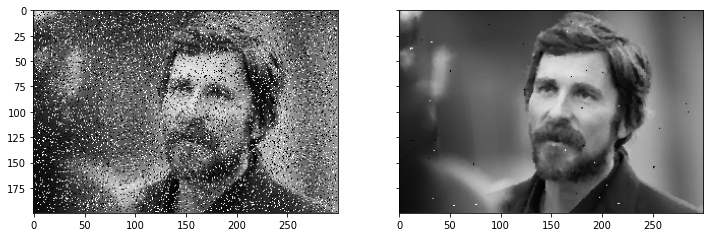

In [23]:
fig, axes  = plt.subplots(1, 2, sharex='all', sharey='all', figsize=(12,12))
imf = cv.medianBlur(imn, 3)
axes[0].imshow(imn, cmap='gray')
axes[1].imshow(imf, cmap='gray')
plt.show()

You can see how nicely median blur removed sault and peper noise.

So let's take a look at median filter.

# Median Filter

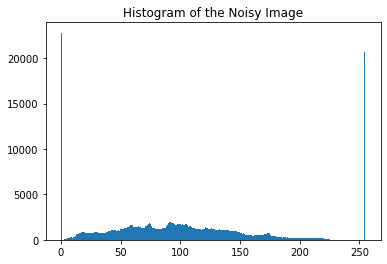

In [24]:
img = cv.imread('./images/bale.jpg', cv.IMREAD_REDUCED_GRAYSCALE_2) # reading the image
imn =  noisy('s&p', img.astype('float32'))                          # creating an image with noise

plt.hist(imn.ravel(), bins=256)                                     # creating the histogram of the noisy image(we discussed about this function in the previous tutorial)
plt.title('Histogram of the Noisy Image')
plt.show()

As you can see in the histogram the intensities 0 and 255 have large values comparing to others. So they must be the noise pixels

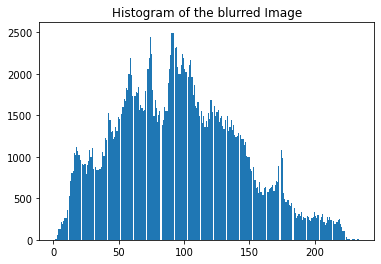

In [25]:
imf = cv.medianBlur(imn, 5)                                         # blurring the image with median blurr
plt.hist(imf.ravel(), bins=256)
plt.title('Histogram of the blurred Image')
plt.show()

In the median blurred image the peaks at 0 and 255 are removed.
Let's look at the two images

In [26]:
cv.imshow("noisy image",imn.astype('uint8'))
cv.waitKey(0)
cv.imshow("noisy image",imf.astype('uint8'))
cv.waitKey(0)
cv.destroyAllWindows()